In [1]:
import xarray as xr
import numpy as np
import matplotlib.pyplot as plt

from arc.arc_util import save_data
from arc.assimilate_jax import assimilate
from arc.approximate_KNN_search import get_neighbours
from arc.s2_data_reader import get_s2_official_data
from arc.arc_sample_generator import generate_arc_refs


In [2]:
da = xr.load_dataset('planet_data.nc')
da

<xarray.Dataset>
Dimensions:      (date: 87, band: 8, y: 130, x: 161)
Coordinates:
  * date         (date) datetime64[ns] 2023-08-21T08:01:58 ... 2023-12-22T08:...
    sza          (date) float64 51.1 56.7 56.4 56.5 51.5 ... 35.8 35.9 35.9 23.5
    vza          (date) float64 2.6 4.5 4.9 4.9 4.9 5.0 ... 5.0 2.4 0.1 0.1 5.0
    raa          (date) float64 239.2 228.8 46.0 46.1 ... 3.4 249.7 250.2 195.5
  * band         (band) object 'B01' 'B02' 'B03' 'B04' 'B05' 'B06' 'B07' 'B08'
Dimensions without coordinates: y, x
Data variables:
    planet_data  (date, band, y, x) float32 nan nan nan nan ... nan nan nan nan
    spatial_ref  int32 0

In [3]:
start_date = "2023-08-20"
end_date = "2023-12-10"
start_date = np.datetime64(start_date)
end_date = np.datetime64(end_date)
date_mask = (da['date'] >= start_date) & (da['date'] <= end_date)


planet_refs = (da['planet_data'][date_mask].values / 10000).transpose(1,0,2,3)
planet_uncs = (da['planet_data'][date_mask].values / 10000 * 0.1).transpose(1,0,2,3)


/Users/fengyin/mambaforge/lib/python3.10/site-packages/matplotlib/cm.py:478: RuntimeWarning: invalid value encountered in cast
  xx = (xx * 255).astype(np.uint8)


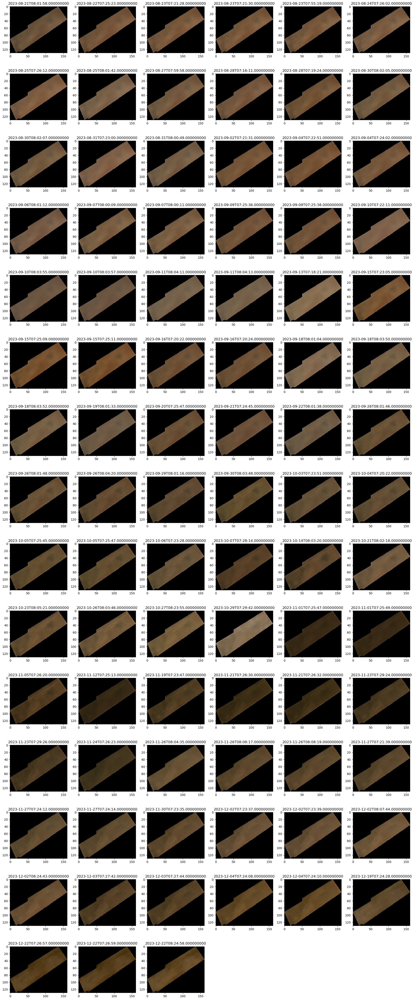

In [4]:
rgb_bands = ['B04', 'B03', 'B02']
# time_series_scenes.sel(band=rgb_bands).plot.imshow(col='time', robust=True)
columns = 6
rows = (da['planet_data'].date.size // columns) +  int((da['planet_data'].date.size % columns) > 0 )
fig, axs = plt.subplots(rows, columns, figsize=(columns * 4, rows * 4))
axs = axs.ravel()
for i, date in enumerate(da['planet_data'].date.values):
    rgb = da['planet_data'].sel(date=date).sel(band=rgb_bands).values
    axs[i].imshow(rgb.transpose(1, 2, 0) / 10000 * 4)
    axs[i].set_title(date)
    # axs[i].axis('off')
for i in range(da['planet_data'].date.size, rows*columns):
    axs[i].axis('off')

In [5]:
start_date = "2023-08-20"
end_date = "2023-12-10"
start_date = np.datetime64(start_date)
end_date = np.datetime64(end_date)
date_mask = (da['date'] >= start_date) & (da['date'] <= end_date)


planet_refs = (da['planet_data'][date_mask].values / 10000).transpose(1,0,2,3)
planet_uncs = (da['planet_data'][date_mask].values / 10000 * 0.1).transpose(1,0,2,3)


doys = da['date'][date_mask].dt.dayofyear.values

mask = ~np.isfinite(planet_refs).all(axis=(0)).any(axis=(0))
planet_refs = planet_refs[:, :, ~mask]
planet_uncs = planet_uncs[:, :, ~mask]

ndvi = (planet_refs[7] - planet_refs[3]) / (planet_refs[7] + planet_refs[3])



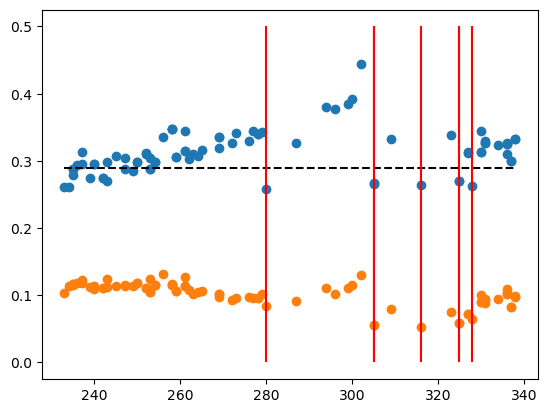

In [6]:
# some of the dates having low NIR values
# potentially due to rain or irrigation
# we will remove these dates from the dataset

mean_nir = np.nanmedian(planet_refs[7], axis=1)
mean_red = np.nanmedian(planet_refs[3], axis=1)
_ = plt.plot(doys, mean_nir, 'o')
_ = plt.plot(doys, mean_red, 'o')


plt.plot([doys[0], doys[-1]], [0.29, 0.29], 'k--')

low_nir_days = doys[(mean_nir < 0.29) & (doys > 270)]

plt.vlines(low_nir_days, 0., 0.5, color='r')


Predicting S2 reflectance: 100%|██████████| 300/300 [00:28<00:00, 10.64slice/s]


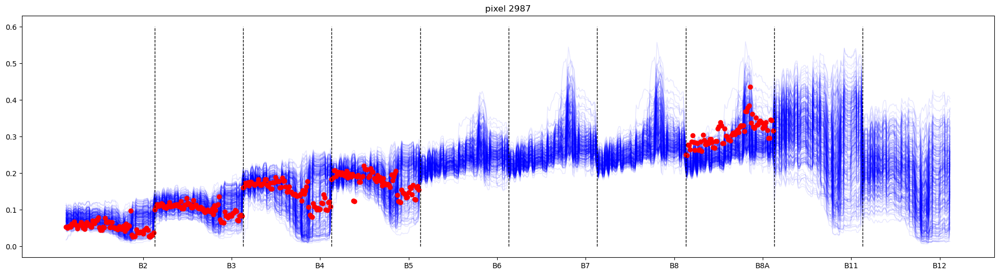

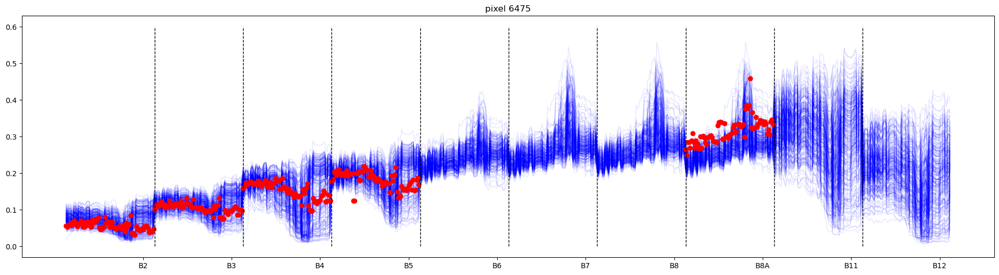

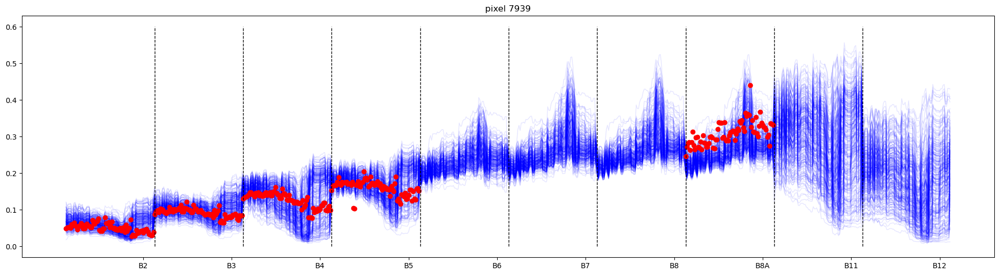

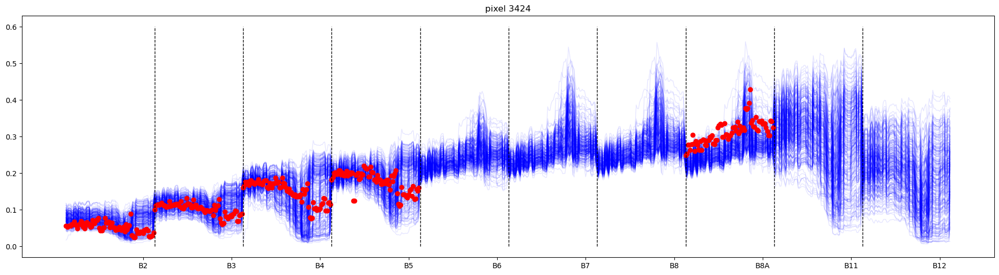

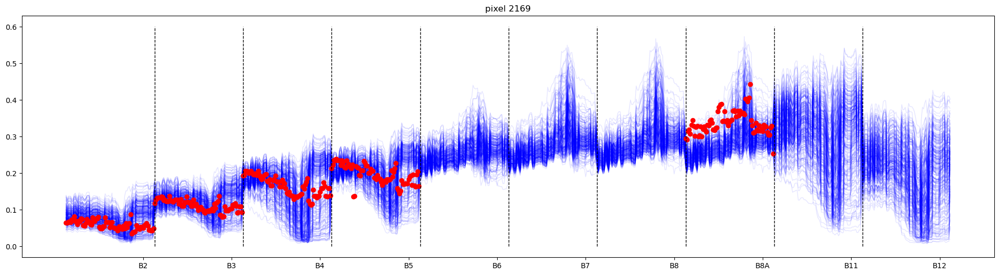

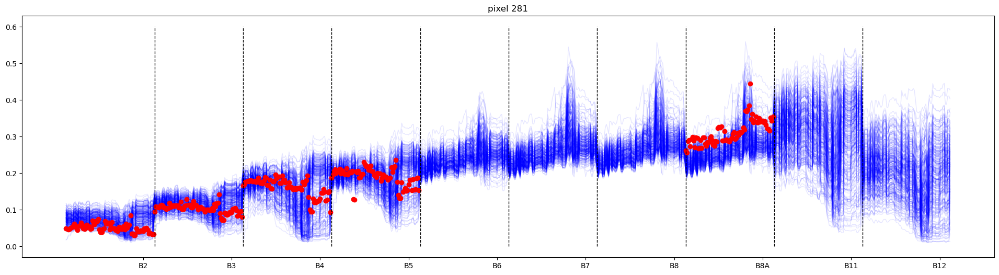

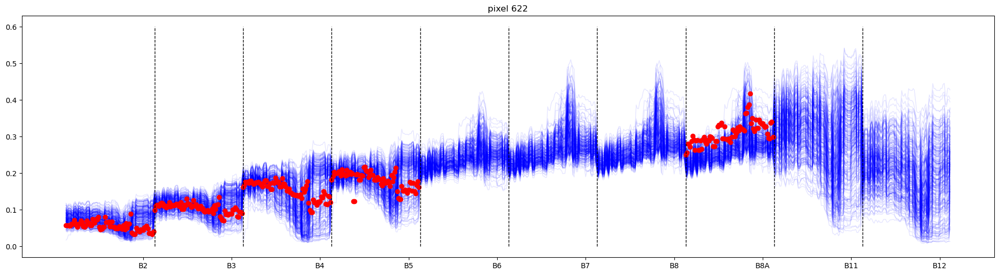

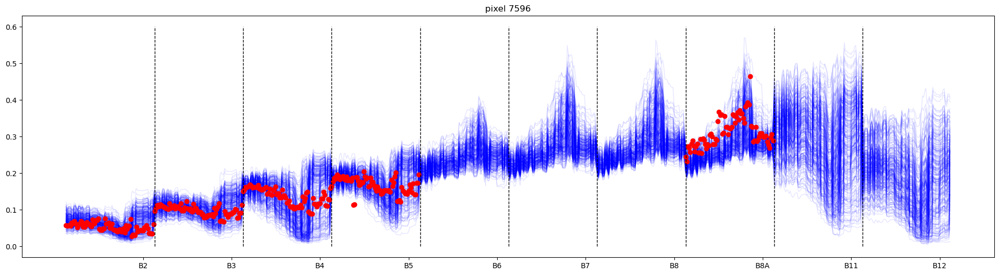

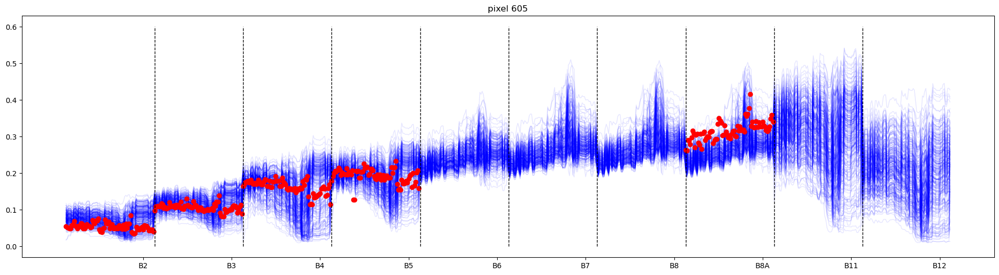

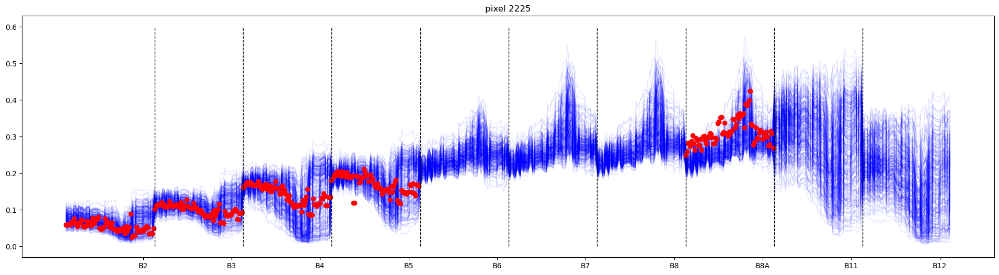

In [21]:
start_date = "2023-08-20"
end_date = "2023-12-20"
start_date = np.datetime64(start_date)
end_date = np.datetime64(end_date)
date_mask = (da['date'] >= start_date) & (da['date'] <= end_date) & (~da['date'].dt.dayofyear.isin(low_nir_days))


planet_refs = (da['planet_data'][date_mask].values / 10000).transpose(1,0,2,3)
planet_uncs = (da['planet_data'][date_mask].values / 10000 * 0.1).transpose(1,0,2,3)


doys = da['date'][date_mask].dt.dayofyear.values

mask = ~np.isfinite(planet_refs).all(axis=(0)).any(axis=(0))
planet_refs = planet_refs[:, :, ~mask]
planet_uncs = planet_uncs[:, :, ~mask]

s2_refs = np.zeros((10, len(doys), planet_refs.shape[-1])) * np.nan

s2_refs[0] = planet_refs[1]
s2_refs[1] = planet_refs[3]
s2_refs[2] = planet_refs[5]
s2_refs[3] = planet_refs[6]
s2_refs[7] = planet_refs[7]

s2_uncs = s2_refs * 0.1

s2_angles = [da['sza'][date_mask].values, da['vza'][date_mask].values, da['raa'][date_mask].values]


# Constants
START_OF_SEASON = 240
CROP_TYPE = "maize"
NUM_SAMPLES = 100000
GROWTH_SEASON_LENGTH = 30
LAZY_EVALUATION_STEP = 100
ALPHA = 0.8
LINE_WIDTH = 2
start_date = "2023-08-20"
end_date = "2023-12-10"

plot = True

    # print("S2_refs shape: ", s2_refs.shape)

    # Generate ARC samples
arc_refs, pheo_samples, bio_samples, orig_bios, soil_samples = generate_arc_refs(
    doys, START_OF_SEASON, GROWTH_SEASON_LENGTH, NUM_SAMPLES, s2_angles, CROP_TYPE
)

# Get neighbours
neighbours = get_neighbours(s2_refs[[0, 1, 2, 3, 7]], s2_uncs[[0, 1, 2, 3, 7]], arc_refs[[0, 1, 2, 3, 7]], doys, steps=70)

if plot:
    random_inds = np.random.choice(s2_refs.shape[-1], 10)
    for i in random_inds:
        import matplotlib.pyplot as plt
        plt.figure(figsize=(24, 6))
        plt.title(f"pixel {i}")
        plt.plot(arc_refs[:, :, neighbours[i]].reshape(-1, 300), '-', color='b', lw=1, alpha=0.1)
        plt.plot(s2_refs[:, :, i].ravel(), 'o', color='red')
        vlines = [len(doys) * i for i in range(1, 10)]
        plt.vlines(vlines, 0, 0.6, color='black', lw=1, ls='--')
        text_locs = [len(doys) * i - 10 for i in range(1, 11)]
        bands = ['B2', 'B3', 'B4', 'B5', 'B6', 'B7', 'B8', 'B8A', 'B11', 'B12']
        plt.xticks(text_locs, bands)
        plt.show()

# Assimilate data
post_bio_tensor, post_bio_unc_tensor, post_bio_scale_tensor, post_pheo_tensor, post_soil_tensor = assimilate(
    s2_refs, arc_refs, s2_uncs, pheo_samples, bio_samples, soil_samples, orig_bios, neighbours
)

# Concatenate tensors
scale_data = np.concatenate([post_bio_scale_tensor, post_pheo_tensor, post_soil_tensor], axis=1)

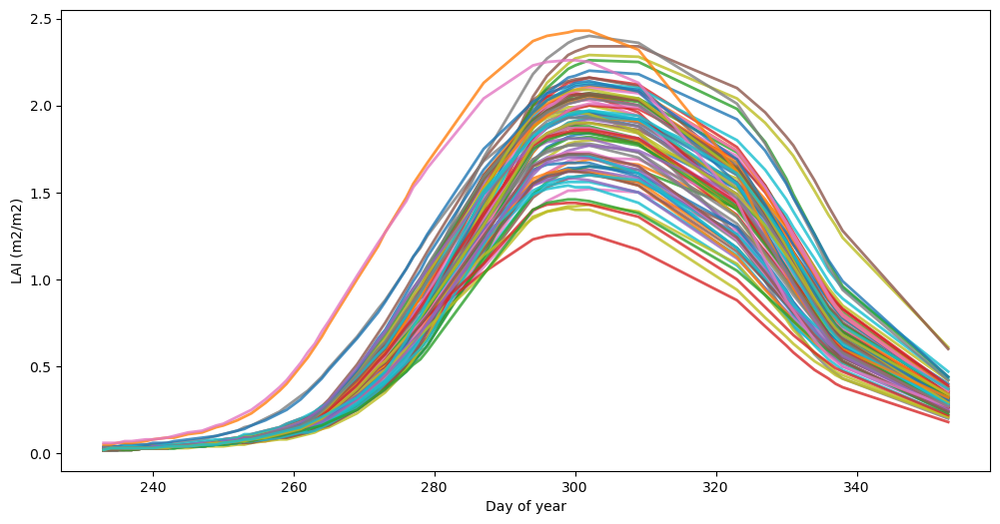

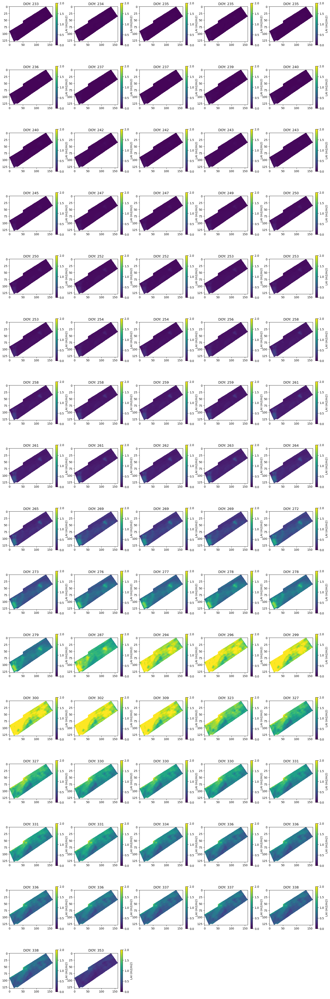

In [22]:

def plot_lai_over_time(doys: np.array, post_bio_tensor: np.array):
    """Plot LAI over time"""

    plt.figure(figsize=(12, 6))
    plt.plot(
        doys,
        post_bio_tensor[
            ::LAZY_EVALUATION_STEP,
            4,
        ].T
        / 100,
        "-",
        lw=LINE_WIDTH,
        alpha=ALPHA,
    )
    plt.ylabel("LAI (m2/m2)")
    plt.xlabel("Day of year")
    plt.show()


def plot_lai_maps(doys: np.array, post_bio_tensor: np.array, mask: np.array):
    """Plot LAI maps"""

    lai = post_bio_tensor[:, 4].T / 100
    nrows = int(len(doys) / 5) + int(len(doys) % 5 > 0)
    fig, axs = plt.subplots(ncols=5, nrows=nrows, figsize=(20, 4 * nrows))
    axs = axs.ravel()

    for i in range(len(doys)):
        lai_map = np.zeros(mask.shape) * np.nan
        lai_map[~mask] = lai[i]
        im = axs[i].imshow(lai_map, vmin=0, vmax=2)
        fig.colorbar(im, ax=axs[i], shrink=0.8, label="LAI (m2/m2)")
        axs[i].set_title("DOY: %d" % doys[i])

    # remove empty plots
    for i in range(len(doys), len(axs)):
        axs[i].axis("off")
    plt.show()



plot_lai_over_time(doys, post_bio_tensor)
plot_lai_maps(doys, post_bio_tensor, mask)

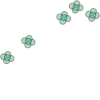

In [23]:
import geojson
from shapely import geometry

features = geojson.load(open('SF_2023_samples_corrected_parsed.geojson', 'r'))['features']
geoms = []
coords = []
for feature in features:
    
    coord = feature['geometry']['coordinates']
    coords.append(coord[:2])
    
    geom = geometry.Point(coord)
    geoms.append(geom)
geometry.GeometryCollection(geoms)

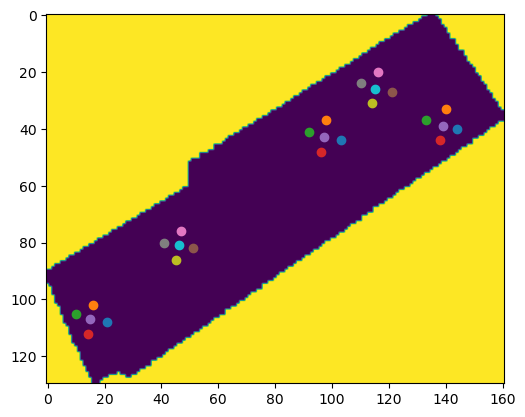

In [24]:
geotransform = tuple(np.array(da.spatial_ref.GeoTransform.split()).astype(float).tolist())
crs = str(da.spatial_ref.crs_wkt)

from pyproj import Transformer
transformer = Transformer.from_crs("EPSG:4326", crs, always_xy=True)
Tcoords = [i for i in transformer.itransform(coords)]


Acoords = np.array([[(i[0] - geotransform[0]) / geotransform[1], (i[1] - geotransform[3]) / geotransform[5]] for i in Tcoords]).astype(int)

for i in Acoords:
    plt.plot(i[0],i[1], 'o')
plt.imshow(mask)

In [25]:
s2_lai = post_bio_tensor[:, 4]
s2_cab = post_bio_tensor[:, 1]

temp = np.zeros(mask.shape + (s2_lai.shape[1], ))
temp[~mask] = s2_lai
s2_lai = temp

temp = np.zeros(mask.shape + (s2_cab.shape[1], ))
temp[~mask] = s2_cab
s2_cab = temp

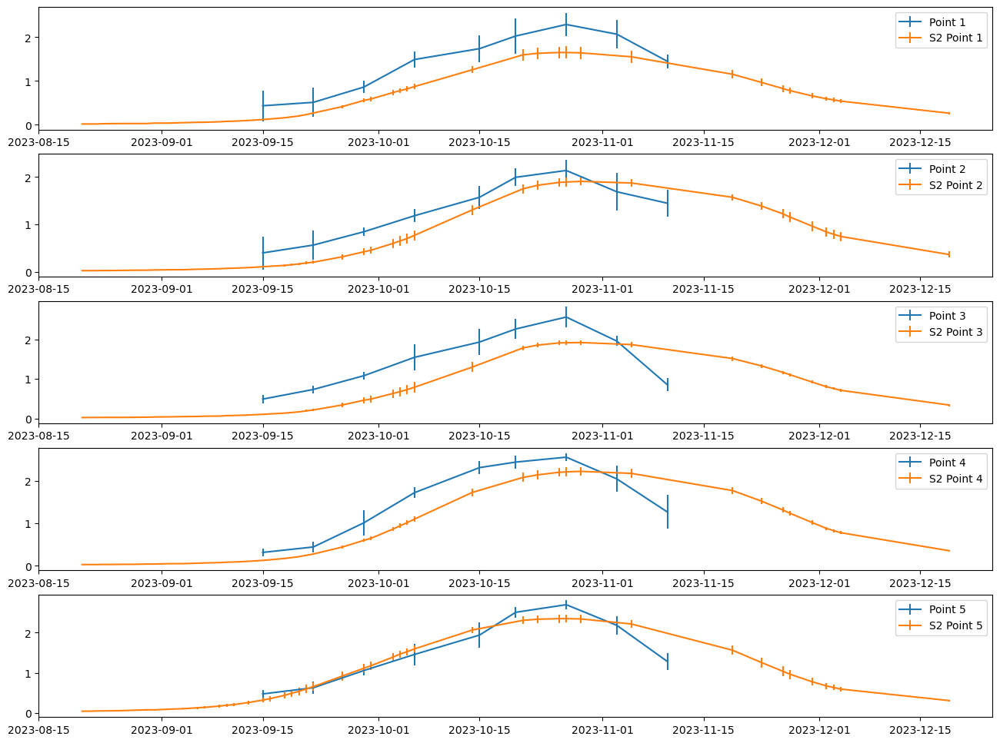

In [26]:
import datetime
import geojson
from shapely import geometry
import pylab as plt

features = geojson.load(open('SF_2023_samples_corrected_parsed.geojson', 'r'))['features']
geoms = []

s2_dates = [datetime.datetime(2023, 1, 1) + datetime.timedelta(days=int(i-1)) for i in doys]

fig, axs = plt.subplots(nrows=5, ncols = 1, figsize=(16, 12))
axs = axs.ravel()

for i in range(1, 6):
    data = []
    sat_data = []
    ax = axs[i-1]
    for j in range(1, 6):
        for feature in features:
            field_id = feature['properties']['Name']
            if field_id == f'P{i}S{j}':
                coord = feature['geometry']['coordinates'][:2]
                geom = geometry.Point(coord)
                
                Tcoord = transformer.transform(coord[0], coord[1])
                Acoord = (Tcoord[0] - geotransform[0]) / geotransform[1], (Tcoord[1] - geotransform[3]) / geotransform[5]
                Acoord = np.array(Acoord).astype(int)
                # print(s2_lai[Acoord[1], Acoord[0]])
                sat_data.append(s2_lai[Acoord[1], Acoord[0]] / 100)
                # sat_data.append(s2_cab[Acoord[0], Acoord[1]] / 100)
                
                lai = feature['properties']['LAI_measurement']
                # cab = feature['properties']['Cab_measurement']
                
                data.append(lai)
                # data.append(cab)
                
                dates = [datetime.datetime.strptime(i, '%Y%m%d') for i in feature['properties']['measurement_dates']]
                # print(field_id)
    val = np.nanmean(data, axis=0)
    std = np.nanstd(data, axis=0)
    
    sat_val = np.nanmean(sat_data, axis=0)
    sat_std = np.nanstd(sat_data, axis=0)
    
    ax.errorbar(dates, val, std,  label = f'Point {i}')
    ax.errorbar(s2_dates, sat_val, sat_std,  label = f'S2 Point {i}')

    ax.legend()

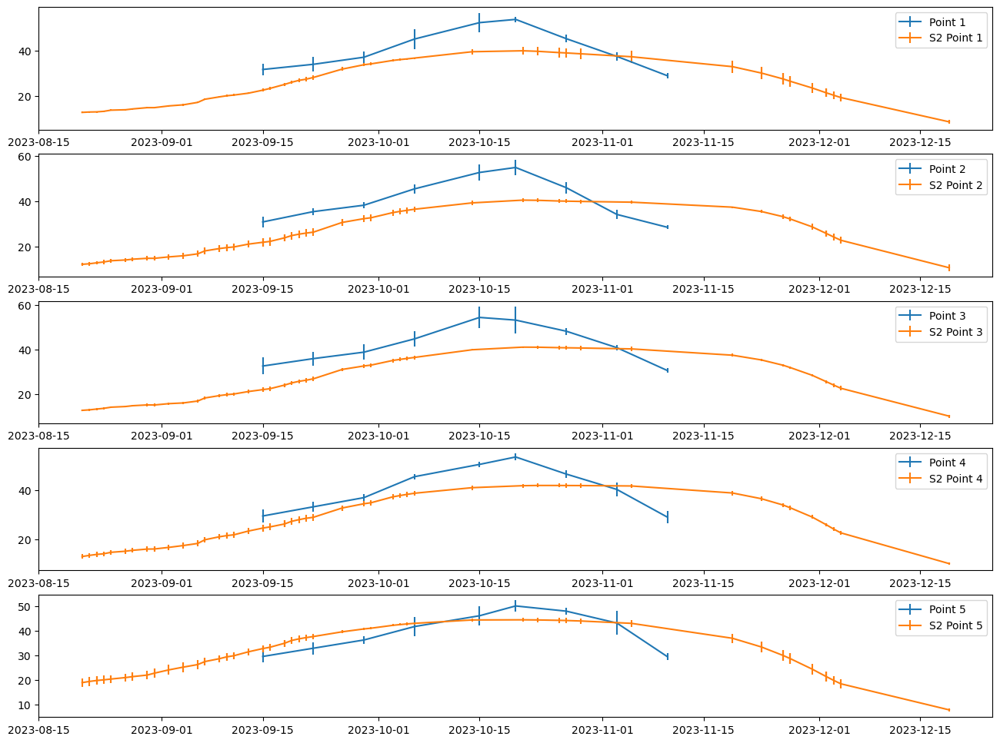

In [27]:
import datetime
import geojson
from shapely import geometry
import pylab as plt

features = geojson.load(open('SF_2023_samples_corrected_parsed.geojson', 'r'))['features']
geoms = []

s2_dates = [datetime.datetime(2023, 1, 1) + datetime.timedelta(days=int(i-1)) for i in doys]

fig, axs = plt.subplots(nrows=5, ncols = 1, figsize=(16, 12))
axs = axs.ravel()

for i in range(1, 6):
    data = []
    sat_data = []
    ax = axs[i-1]
    for j in range(1, 6):
        for feature in features:
            field_id = feature['properties']['Name']
            if field_id == f'P{i}S{j}':
                coord = feature['geometry']['coordinates'][:2]
                geom = geometry.Point(coord)
                
                Tcoord = transformer.transform(coord[0], coord[1])
                Acoord = (Tcoord[0] - geotransform[0]) / geotransform[1], (Tcoord[1] - geotransform[3]) / geotransform[5]
                Acoord = np.array(Acoord).astype(int)
                # sat_data.append(s2_lai[Acoord[0], Acoord[1]] / 100)
                sat_data.append(s2_cab[Acoord[1], Acoord[0]] / 100 )
                
                lai = feature['properties']['LAI_measurement']
                cab = feature['properties']['Cab_measurement']
                
                
                # data.append(lai)
                data.append(cab)
                
                dates = [datetime.datetime.strptime(i, '%Y%m%d') for i in feature['properties']['measurement_dates']]
                # print(field_id)
    val = np.nanmean(data, axis=0)
    std = np.nanstd(data, axis=0)
    
    sat_val = np.nanmean(sat_data, axis=0)
    sat_std = np.nanstd(sat_data, axis=0)
    
    ax.errorbar(dates, val, std,  label = f'Point {i}')
    ax.errorbar(s2_dates, sat_val, sat_std,  label = f'S2 Point {i}')

    ax.legend()